# BNB: Metadata and Gene Expression of Cells Selected by Region Sketch
Data is obtained from 10X Genomics

In [9]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
env: ANYWIDGET_HMR=1


In [10]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
from celldega.pre.boundary_tile import batch_transform_geometries
from celldega.pre import to_geometry
import geopandas as gpd
from shapely.geometry import Point

# Data initialization

In [12]:
dataset_name = 'Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_outs'
tech = 'Xenium'

DATA_DIR = f'/Users/whuan/dev/celldega/data'
data_dir = f'{DATA_DIR}/{dataset_name}'
path_landscape_files = f'{dataset_name}'

## Load region polygon (both in pixel and micron space)


In [13]:
# Load Geo parquet
gdf_pixel = gpd.read_parquet(f'{path_landscape_files}/sketched_regions_pixel.parquet')
display(gdf_pixel)

gdf_micron = gpd.read_parquet(f'{path_landscape_files}/sketched_regions_micron.parquet')
display(gdf_micron)


,area,roi,color,geometry
0,8.524067e+07,ROI 1,"[50.38252999404976, 171.42419118220474, 2.4771...","POLYGON ((12399.825 14504.681, 14069.862 13098..."
1,3.066227e+07,ROI 2,"[79.98959877143285, 128.68419351357974, 162.15...","POLYGON ((41232.827 19225.682, 42077.577 19066..."
2,5.847033e+08,ROI 3,"[110.46152566756015, 2.5032325793740675, 66.94...","POLYGON ((29354.682 476.855, 36945.621 377.290..."


,area,roi,color,geometry
0,3.849150e+06,ROI 1,"[50.38252999404976, 171.42419118220474, 2.4771...","POLYGON ((2634.963 3082.245, 2989.846 2783.429..."
1,1.384593e+06,ROI 2,"[79.98959877143285, 128.68419351357974, 162.15...","POLYGON ((8761.976 4085.458, 8941.486 4051.726..."
2,2.640301e+07,ROI 3,"[110.46152566756015, 2.5032325793740675, 66.94...","POLYGON ((6237.870 101.332, 7850.945 80.174, 7..."


## Transform points from pixel space to micron space

In [26]:
cell_meta = pd.read_parquet(f"{path_landscape_files}/cell_metadata.parquet")
cell_meta["geometry"] = cell_meta["geometry"].apply(lambda coords: Point(coords[0], coords[1]))
cell_meta_gdf = gpd.GeoDataFrame(cell_meta, geometry="geometry", crs="EPSG:4326")

gdf_join = gdf_pixel.sjoin(cell_meta_gdf, how='right', predicate='intersects').drop(columns=['index_left'], errors='ignore')
df_cluster = pd.read_parquet(f"{dataset_name}/cell_clusters/cluster.parquet")
gdf_join['cluster'] = df_cluster['cluster']

gene_list = ['EPCAM','AQP8','MDM2']

ovarian_cancer_markers = [
    "MUC16",
    "TP53",
    "BRCA1",
    "BRCA2",
    "KRAS",
    "PTEN",
    "PIK3CA",
    "FOXL2",
    "HNF1B",
    "MSH2",
    "MSH6",
    "MLH1",
    "PMS2",
    "CCNE1",
]

for gene in ovarian_cancer_markers+gene_list:
    df_gene = pd.read_parquet(f"{dataset_name}/cbg/{gene}.parquet")
    df_gene['cell_id'] = df_gene.index
    gdf_join = pd.merge(gdf_join, df_gene, on='cell_id', how='left')
    
gdf_join.head()

/Users/whuan/opt/anaconda3/envs/celldega_env_2025/lib/python3.10/site-packages/geopandas/geodataframe.py:2195: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)  # noqa: B026


,cell_id,area,roi,color,name,geometry,cluster,MUC16,TP53,BRCA1,...,FOXL2,HNF1B,MSH2,MSH6,MLH1,PMS2,CCNE1,EPCAM,AQP8,MDM2
0,aaaaebmm-1,5.847033e+08,ROI 3,"[110.46152566756015, 2.5032325793740675, 66.94...",aaaaebmm-1,POINT (2545.24510 19907.04354),7,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,aaaafhpp-1,5.847033e+08,ROI 3,"[110.46152566756015, 2.5032325793740675, 66.94...",aaaafhpp-1,POINT (2507.57966 19966.68049),8,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
2,aaaahcem-1,5.847033e+08,ROI 3,"[110.46152566756015, 2.5032325793740675, 66.94...",aaaahcem-1,POINT (2483.01107 19955.99575),7,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0
3,aaaakeoi-1,5.847033e+08,ROI 3,"[110.46152566756015, 2.5032325793740675, 66.94...",aaaakeoi-1,POINT (2514.67869 19925.56376),7,NaN,NaN,NaN,...,NaN,NaN,NaN,1.0,NaN,NaN,NaN,2.0,NaN,NaN
4,aaaalald-1,5.847033e+08,ROI 3,"[110.46152566756015, 2.5032325793740675, 66.94...",aaaalald-1,POINT (2482.79393 19919.32525),1,1.0,NaN,NaN,...,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
path_transformation_matrix = f'{path_landscape_files}/xenium_transform.csv'

transformation_matrix = pd.read_csv(
    path_transformation_matrix, header=None, sep=" "
).values

# From pixel to micron space
inverse_matrix = np.linalg.inv(transformation_matrix)

gdf_join_micron = gdf_join.copy()
gdf_join_micron["geometry"] = batch_transform_geometries(gdf_join_micron["geometry"], inverse_matrix, 1)
gdf_join_micron['geometry'] = gdf_join_micron['geometry'].apply(to_geometry)

## Cluster of region selected cells

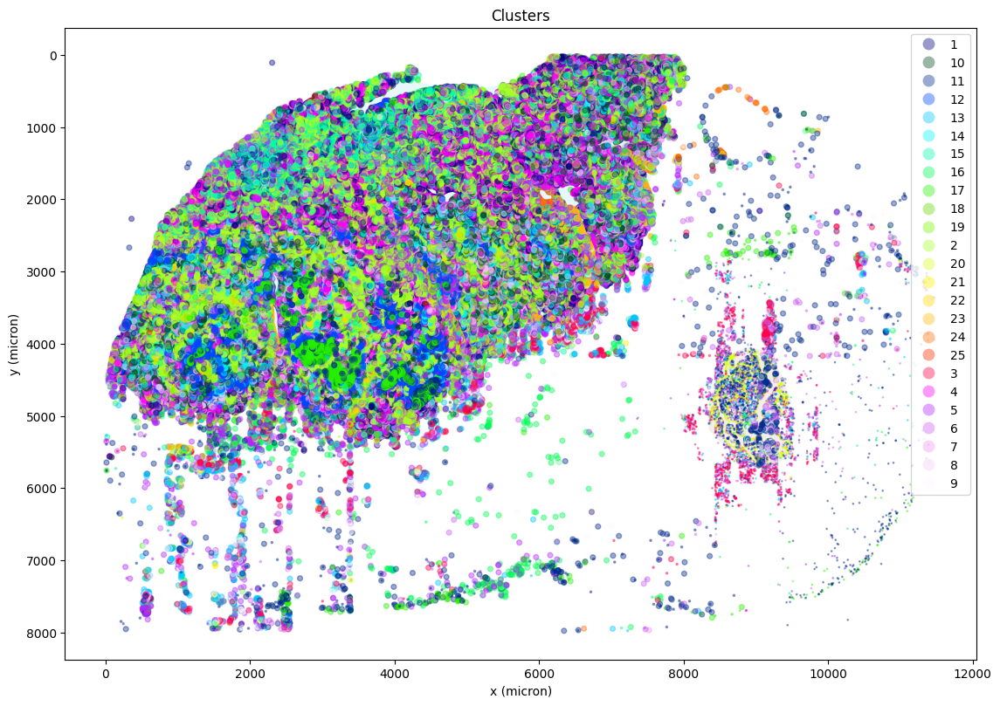

In [29]:

fig, ax = plt.subplots(figsize=(20,8))

# Plot the base layer (ROI)
gdf_micron.plot(ax=ax, column='roi', legend=True, cmap='tab10', alpha=0.1)

gdf_join_micron.plot(
    ax=ax,
    column='cluster',
    aspect=1,
    legend=True,
    alpha=0.4,
    cmap='gist_ncar',
    markersize=gdf_join_micron['area'] * 0.3 / 1e7,
)

# Adjust the plot
ax.invert_yaxis()
plt.title("Clusters")
plt.tight_layout()
plt.xlabel('x (micron)')
plt.ylabel('y (micron)')
plt.show()


## Gene expression of region selected cells

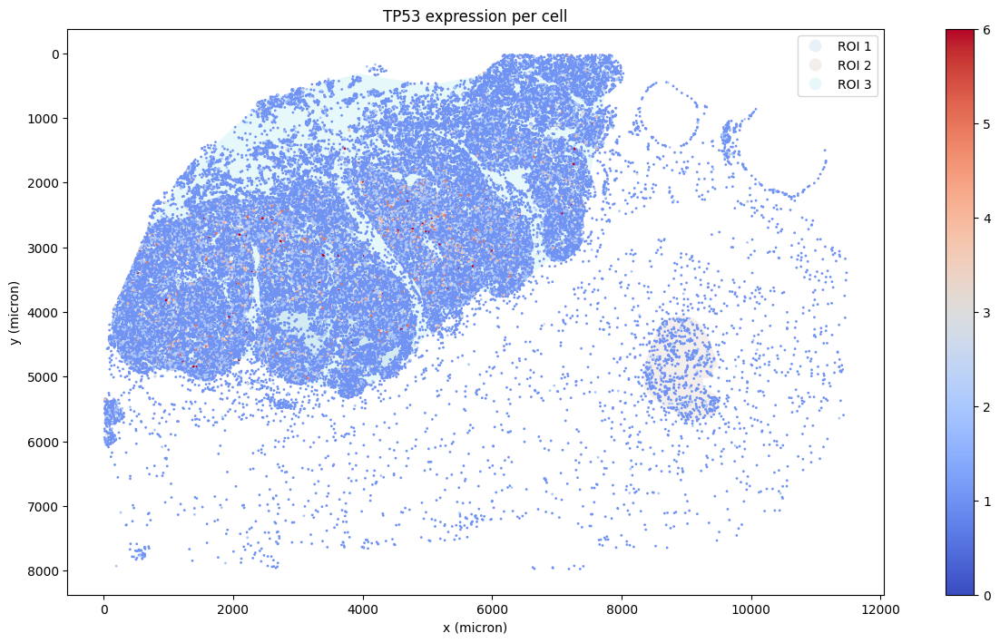

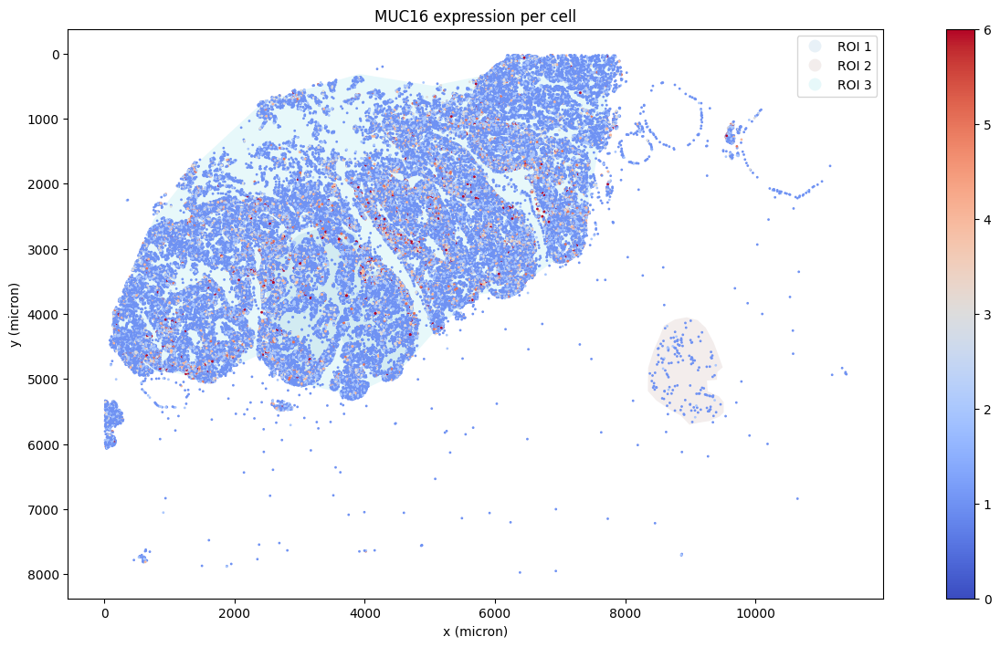

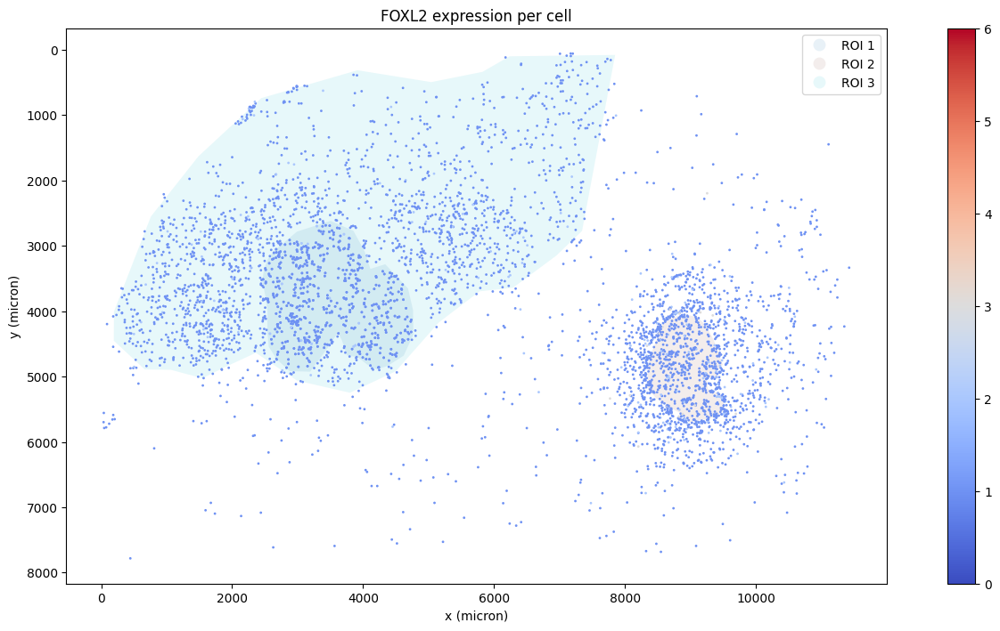

In [33]:
for gene in ['TP53', 'MUC16','FOXL2']:

    fig, ax = plt.subplots(figsize=(14, 7))
    gdf_micron.plot(ax=ax, column='roi', legend=True, cmap='tab10', alpha=0.1)
    gdf_join_micron.plot(ax=ax, aspect=1, column=gene, legend=True, vmin=0, vmax=6, cmap='coolwarm', s=1)

    ax.invert_yaxis()
    plt.title(f"{gene} expression per cell")
    plt.tight_layout()
    plt.xlabel('x (micron)')
    plt.ylabel('y (micron)')
    plt.show()